# Introduction

## Importations

In [51]:
import numpy as np
import pandas as pd 

import os
import time

import matplotlib.pyplot as plt
import seaborn as sns

from itertools import product

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_auc_score, fbeta_score, accuracy_score

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

import shap

from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

import warnings
warnings.filterwarnings("ignore")

include_mlflow = False

In [2]:
if include_mlflow :
    
    import mlflow

    mlflow.set_tracking_uri("http://localhost:5000")
    mlflow.set_experiment("oc_projet_7_premiers_modeles")
    
    def mlflow_save_results(run_name, model_params = None, data_params = None, metrics = None) :
    
        with mlflow.start_run(run_name = run_name) :

            if model_params is not None :
                mlflow.log_params(model_params)

            if data_params is not None :
                mlflow.log_params(data_params)

            if metrics is not None :
                for metric, value in metrics.items() :
                    mlflow.log_metric(metric, value)

## Aperçu des données

In [3]:
app_data = pd.read_csv("csv/application_train.csv")
print("Dimensions :", app_data.shape)
app_data.head()

Dimensions : (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
print("Nombre de colonnes par type :")
app_data.dtypes.value_counts()

Nombre de colonnes par type :


float64    65
int64      41
object     16
Name: count, dtype: int64

In [5]:
print("Cardinalité des variables catégorielles :")
app_data.select_dtypes("object").apply(pd.Series.nunique, axis = 0)

Cardinalité des variables catégorielles :


NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

## Valeurs manquantes

In [6]:
def missing_values_table(df) :

    count = df.isnull().sum()
    percentage = 100 * df.isnull().sum() / len(df)
        
    table = pd.concat([count, percentage], axis = 1)
    table = table.rename(columns = {0 : "Missing Values", 1 : "Percentage"})
    table = table.loc[table["Missing Values"] != 0]
    table = table.sort_values("Percentage", ascending = False).round(1)

    print("Valeurs manquantes dans", len(table), "des", len(df), "colonnes.")
    
    return table

In [7]:
missing_values_table(app_data).head(10)

Valeurs manquantes dans 67 des 307511 colonnes.


,Missing Values,Percentage
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


## Distribution de la cible

In [8]:
target_count = app_data["TARGET"].value_counts()
print(target_count)

TARGET
0    282686
1     24825
Name: count, dtype: int64


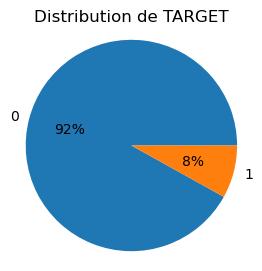

In [9]:
target_count.plot.pie(figsize = (3, 3), autopct = "%1.0f%%")
plt.axis("equal")
plt.ylabel("")
plt.title("Distribution de TARGET")
plt.show()

## Encodage des variables catégorielles

In [10]:
df = app_data.copy()

print("Application du Label Encoder :")
label_encoder = LabelEncoder()

for column in df.columns :
    if df[column].dtype == "object" :
        if len(list(df[column].unique())) <= 2 :
            label_encoder.fit(df[column])
            df[column] = label_encoder.transform(df[column])
            print(column)
            
print("\nApplication du Onehot Encoder :")
df = pd.get_dummies(df)
print("Le jeu de données a désormais", len(df.columns), "colonnes.")

Application du Label Encoder :
NAME_CONTRACT_TYPE
FLAG_OWN_CAR
FLAG_OWN_REALTY

Application du Onehot Encoder :
Le jeu de données a désormais 243 colonnes.


# Analyse exploratoire

## Anomalies

In [11]:
(df["DAYS_BIRTH"] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [12]:
df["DAYS_EMPLOYED"].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [13]:
def plot_histogram(df, feature, label, bins, figsize) :

    df[feature].plot.hist(
        figsize = figsize,
        title = f"Distribution de {feature}",
        edgecolor = "k",
        bins = bins
    )

    plt.xlabel(label)
    plt.ylabel("Effectif")
    plt.show()

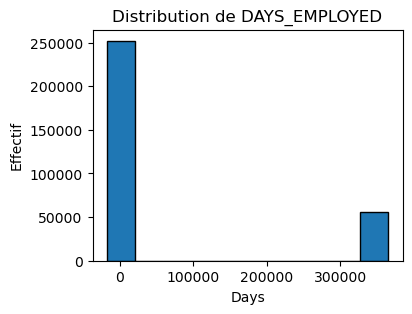

In [14]:
plot_histogram(df, "DAYS_EMPLOYED", "Days", 10, (4, 3))

In [15]:
anom = df[df["DAYS_EMPLOYED"] > 40000]
non_anom = df[df["DAYS_EMPLOYED"] <= 40000]

default_anom = round(100 * anom["TARGET"].mean(), 1)
default_non_anom = round(100 * non_anom["TARGET"].mean(), 1)

print("Nombre d'entrées anormales :", len(anom), "sur", len(df))
print("Défaut de remboursement pour les entrées normales :", default_non_anom, "%")
print("Défaut de remboursement pour les entrées anormales :", default_anom, "%")

Nombre d'entrées anormales : 55374 sur 307511
Défaut de remboursement pour les entrées normales : 8.7 %
Défaut de remboursement pour les entrées anormales : 5.4 %


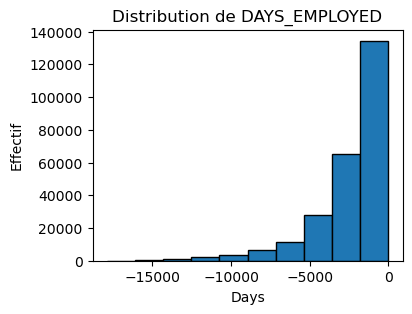

In [16]:
df["DAYS_EMPLOYED_ANOM"] = (df["DAYS_EMPLOYED"] > 40000)
df.loc[df["DAYS_EMPLOYED"] > 40000, "DAYS_EMPLOYED"] = np.nan

plot_histogram(df, "DAYS_EMPLOYED", "Days", 10, (4, 3))

## Corrélations

In [17]:
start_time = time.time()

correlations = df.corr()["TARGET"]

duration = round(time.time() - start_time, 3)
print("Temps pour calculer les corrélations :", duration, "secondes")

Temps pour calculer les corrélations : 36.707 secondes


In [18]:
print("Meilleurs correlations positives")
print(correlations.sort_values(ascending = False).head(10))

print("\nMeilleurs correlations négatives")
print(correlations.sort_values().head(10))

Meilleurs correlations positives
TARGET                         1.000000
DAYS_BIRTH                     0.078239
DAYS_EMPLOYED                  0.074958
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
NAME_INCOME_TYPE_Working       0.057481
DAYS_LAST_PHONE_CHANGE         0.055218
CODE_GENDER_M                  0.054713
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
Name: TARGET, dtype: float64

Meilleurs correlations négatives
EXT_SOURCE_3                           -0.178919
EXT_SOURCE_2                           -0.160472
EXT_SOURCE_1                           -0.155317
NAME_EDUCATION_TYPE_Higher education   -0.056593
CODE_GENDER_F                          -0.054704
NAME_INCOME_TYPE_Pensioner             -0.046209
DAYS_EMPLOYED_ANOM                     -0.045987
ORGANIZATION_TYPE_XNA                  -0.045987
FLOORSMAX_AVG                          -0.044003
FLOORSMAX_MEDI                         -0.043768
Name: TARGET, 

## Impact de l'âge sur le remboursement

In [19]:
age_data = df[["TARGET", "DAYS_BIRTH"]].copy()
age_data["DAYS_BIRTH"] = abs(age_data["DAYS_BIRTH"])

age_corr = age_data["DAYS_BIRTH"].corr(age_data["TARGET"])
print("Corrélation entre l'âge et la cible :", age_corr)

Corrélation entre l'âge et la cible : -0.07823930830982692


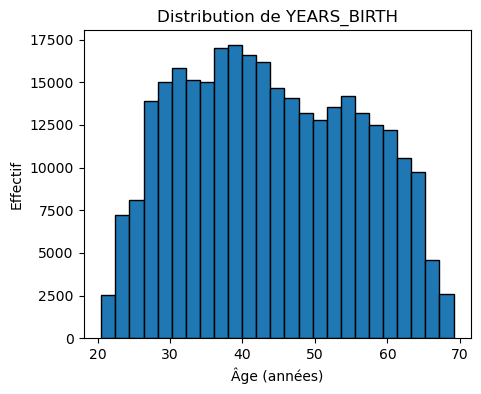

In [20]:
age_data["YEARS_BIRTH"] = age_data["DAYS_BIRTH"] / 365
plot_histogram(age_data, "YEARS_BIRTH", "Âge (années)", 25, (5, 4))

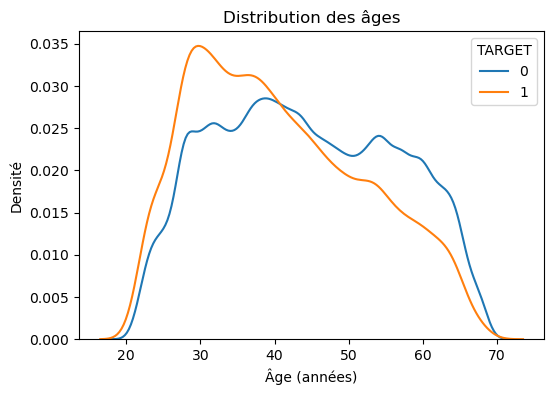

In [21]:
plt.figure(figsize = (6, 4))

sns.kdeplot(age_data.loc[age_data["TARGET"] == 0, "YEARS_BIRTH"], label = "0")
sns.kdeplot(age_data.loc[age_data["TARGET"] == 1, "YEARS_BIRTH"], label = "1")

plt.xlabel("Âge (années)")
plt.ylabel("Densité")
plt.title("Distribution des âges")
plt.legend(title = "TARGET")
plt.show()

In [22]:
age_data["YEARS_BINNED"] = pd.cut(age_data["YEARS_BIRTH"],
                                  bins = np.linspace(20, 70, num = 11))

age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [23]:
age_groups = age_data.groupby("YEARS_BINNED").mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


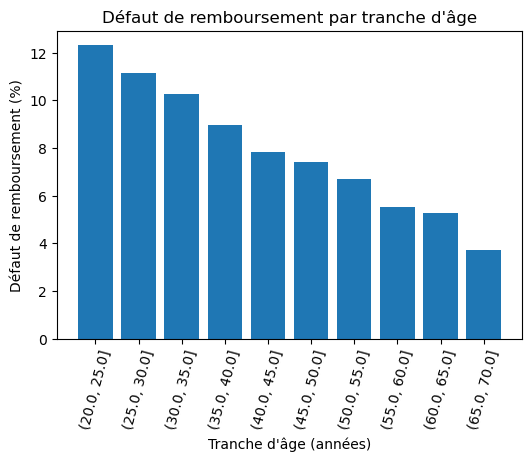

In [24]:
plt.figure(figsize = (6, 4))

plt.bar(age_groups.index.astype(str), 100 * age_groups["TARGET"])

plt.xticks(rotation = 75)
plt.xlabel("Tranche d'âge (années)")
plt.ylabel("Défaut de remboursement (%)")
plt.title("Défaut de remboursement par tranche d'âge")
plt.show()

## Sources extérieures

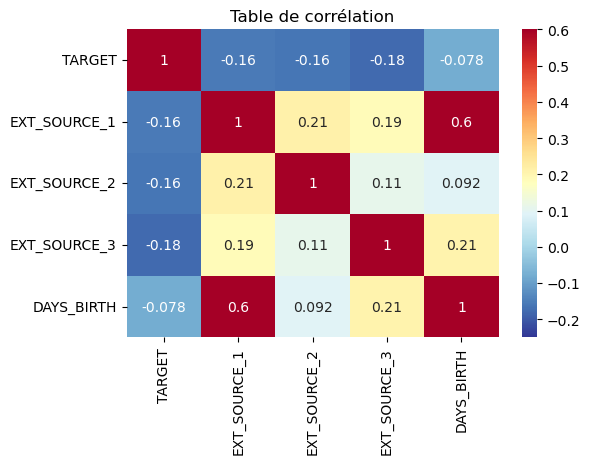

In [25]:
ext_data = df[["TARGET", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3", "DAYS_BIRTH"]]
ext_data["DAYS_BIRTH"] = abs(ext_data["DAYS_BIRTH"])

plt.figure(figsize = (6, 4))
sns.heatmap(ext_data.corr(), cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title("Table de corrélation")
plt.show()

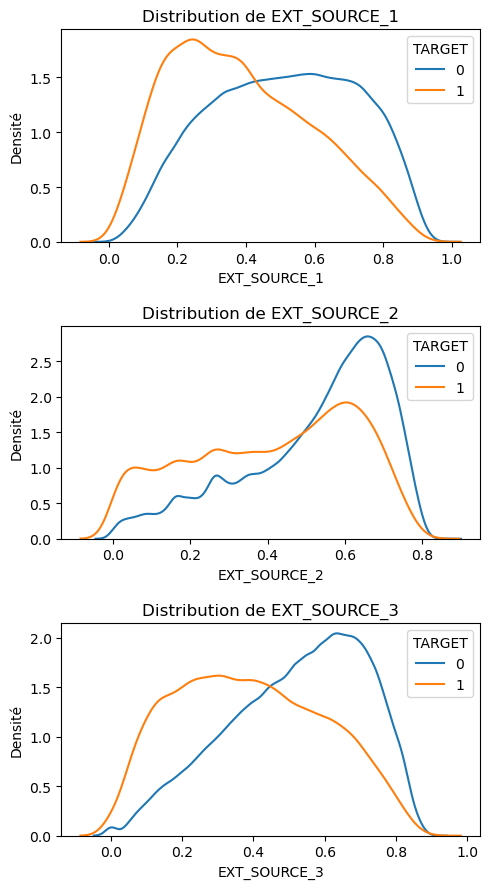

In [26]:
plt.figure(figsize = (5, 9))

for i, source in enumerate(["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]) :

    plt.subplot(3, 1, i + 1)
    
    sns.kdeplot(ext_data.loc[ext_data["TARGET"] == 0, source], label = "0")
    sns.kdeplot(ext_data.loc[ext_data["TARGET"] == 1, source], label = "1")
    
    plt.title(f"Distribution de {source}")
    plt.xlabel(source)
    plt.ylabel("Densité")
    plt.legend(title = "TARGET")
    
plt.tight_layout(h_pad = 1.5)

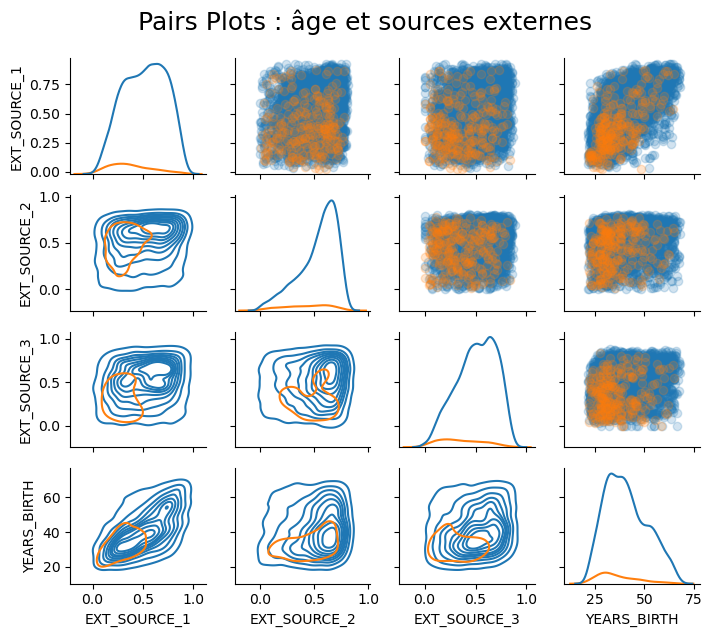

In [27]:
def corr_func(x, y, **kwargs) :
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy = (.2, .8), xycoords = ax.transAxes, size = 20)

plot_data = ext_data.drop(columns = ["DAYS_BIRTH"]).copy()
plot_data["YEARS_BIRTH"] = age_data["YEARS_BIRTH"]
plot_data = plot_data.dropna().loc[:10000, :]

grid = sns.PairGrid(data = plot_data, diag_sharey = False, hue = "TARGET",
                    vars = [x for x in list(plot_data.columns) if x != "TARGET"],
                    height = 1.5, aspect = 1.2)

grid.map_upper(plt.scatter, alpha = 0.2)
grid.map_diag(sns.kdeplot)
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r)

plt.suptitle("Pairs Plots : âge et sources externes", size = 18, y = 1.05)
plt.show()

## Création de ratios

In [28]:
df_domain = df.copy()

df_domain["CREDIT_INCOME_PERCENT"] = df_domain["AMT_CREDIT"] / df_domain["AMT_INCOME_TOTAL"]
df_domain["ANNUITY_INCOME_PERCENT"] = df_domain["AMT_ANNUITY"] / df_domain["AMT_INCOME_TOTAL"]
df_domain["CREDIT_TERM"] = df_domain["AMT_ANNUITY"] / df_domain["AMT_CREDIT"]
df_domain["DAYS_EMPLOYED_PERCENT"] = df_domain["DAYS_EMPLOYED"] / df_domain["DAYS_BIRTH"]

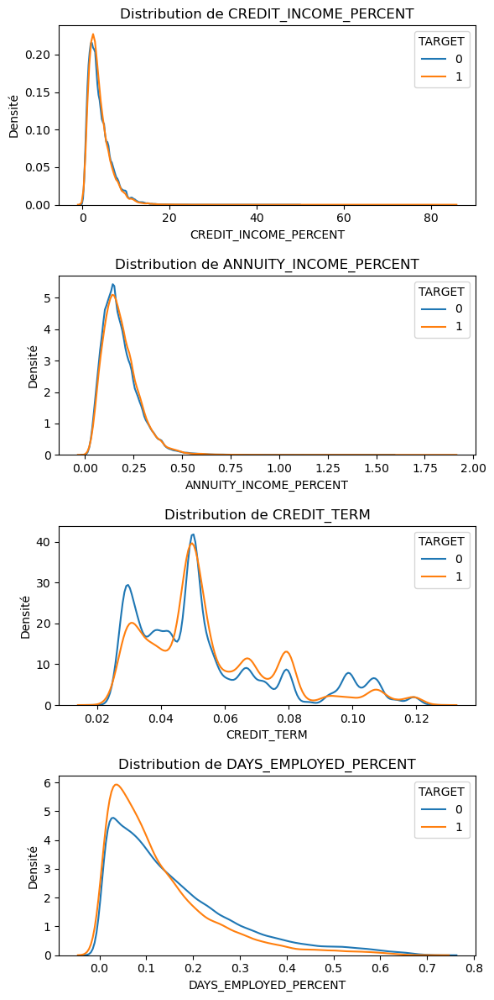

In [29]:
plt.figure(figsize = (6, 12))

features = ["CREDIT_INCOME_PERCENT", "ANNUITY_INCOME_PERCENT", "CREDIT_TERM", "DAYS_EMPLOYED_PERCENT"]

for i, feature in enumerate(features) :
    
    plt.subplot(4, 1, i + 1)
    
    sns.kdeplot(df_domain.loc[df_domain["TARGET"] == 0, feature], label = "0")
    sns.kdeplot(df_domain.loc[df_domain["TARGET"] == 1, feature], label = "1")

    plt.title(f"Distribution de {feature}")
    plt.xlabel(feature)
    plt.ylabel("Densité")
    plt.legend(title = "TARGET")
    
plt.tight_layout(h_pad = 1.5)

# Apprentissage automatique

## Préparation des données

In [30]:
print(df.dtypes.value_counts().to_string())

bool       135
float64     66
int64       40
int32        3


In [31]:
clean_df = df.copy()

for column in clean_df.columns :
        if clean_df[column].dtype == "int32" or clean_df[column].dtype == "bool" :
            clean_df[column] = clean_df[column].astype("int64")
            
print(clean_df.dtypes.value_counts().to_string())

int64      178
float64     66


In [32]:
def clean_column_names(column_name) :
    
    # Suppression de sous-chaînes :
    for c in [" Entity Type", ": type", " /", ","] :
        column_name = column_name.replace(c, "")
    
    # Remplacement "Co-op" par "Coop"
    column_name = column_name.replace("Co-op", "Coop")
    
    # Remplacement des caractères spéciaux par "_"
    for c in " .,:/\\|@#$%^&*()-+=[]{}<>?!`~\'" :
        column_name = column_name.replace(c, "_")

    # Passage en majuscules
    return column_name.upper()

In [33]:
clean_df.columns = [clean_column_names(col) for col in clean_df.columns]

In [34]:
def split_data(df) :

    X = df.drop(columns = ["TARGET", "SK_ID_CURR"])
    y = df["TARGET"]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 42)

    print("--- Séparation du jeu de données ---")
    print("Dimensions du jeu d'entraînement :", X_train.shape)
    print("Dimensions du jeu de test :", X_test.shape)
    
    return X_train, X_test, y_train, y_test

In [35]:
X_train, X_test, y_train, y_test = split_data(clean_df)

--- Séparation du jeu de données ---
Dimensions du jeu d'entraînement : (246008, 242)
Dimensions du jeu de test : (61503, 242)


## Prétraitement

In [36]:
class CustomMedianImputer :
    
    def __init__(self) :
        self.median_values = {}
        
    def fit(self, df) :
        for col in df.columns :
            self.median_values[col] = df[col].median()
    
    def transform(self, df) :
        new_df = df.copy()
        for col in new_df.columns :
            new_df[col] = new_df[col].fillna(self.median_values[col])
        return new_df
    
    def fit_transform(self, df) :
        self.fit(df)
        return self.transform(df)

In [37]:
class CustomMinMaxScaler :
    
    def __init__(self, feature_range = (0, 1)):
        self.feature_range = feature_range
        self.min_values = {}
        self.max_values = {}
        
    def fit(self, df):
        for col in df.columns:
            self.min_values[col] = df[col].min()
            self.max_values[col] = df[col].max()
    
    def transform(self, df) :
        new_df = df.copy()
        for col in df.columns :
            min_range = self.min_values[col]
            max_range = self.max_values[col]
            new_df[col] -= min_range
            new_df[col] /= (max_range - min_range)
            new_df[col] *= (self.feature_range[1] - self.feature_range[0])
            new_df[col] += self.feature_range[0]
        return new_df
    
    def fit_transform(self, df) :
        self.fit(df)
        return self.transform(df)

In [38]:
def preprocess(X_train, X_test) :
    
    imputer = CustomMedianImputer()
    scaler = CustomMinMaxScaler()

    X_train_imputed = imputer.fit_transform(X_train)
    X_train_scaled = scaler.fit_transform(X_train_imputed)

    X_test_imputed = imputer.transform(X_test)
    X_test_scaled = scaler.transform(X_test_imputed)
    
    return X_train_scaled, X_test_scaled

In [39]:
X_train_processed, X_test_processed = preprocess(X_train, X_test)

## Choix de la métrique

In [39]:
classifier = LogisticRegression()
classifier.fit(X_train_processed, y_train)

proba_preds_train = classifier.predict_proba(X_train_processed)[:, 1]
proba_preds_test = classifier.predict_proba(X_test_processed)[:, 1]

In [40]:
auroc_train = roc_auc_score(y_train, proba_preds_train)
print("Score AUROC (train) :", round(auroc_train, 5))

auroc_test = roc_auc_score(y_test, proba_preds_test)
print("Score AUROC (test) :", round(auroc_test, 5))

Score AUROC (train) : 0.74697
Score AUROC (test) : 0.74664


In [41]:
def rge_score(labels, binary_preds, credit_amounts, interest_ratio = 0.1) :
    
    expected_gain = 0
    effective_gain = 0
    
    for label, pred, credit_amount in zip(labels, binary_preds, credit_amounts) :
        if label == 0 :
            expected_gain += interest_ratio * credit_amount
            if pred == 0 :
                effective_gain += interest_ratio * credit_amount
        if label == 1 and pred == 0 :
            effective_gain -= credit_amount
            
    return effective_gain / expected_gain

In [42]:
acceptance = 0.5

binary_preds_train = (proba_preds_train >= acceptance).astype(int)
rge_train = rge_score(y_train, binary_preds_train, X_train["AMT_CREDIT"])
print("Score RGE (train) :", round(rge_train, 5))

binary_preds_test = (proba_preds_test >= acceptance).astype(int)
rge_test = rge_score(y_test, binary_preds_test, X_test["AMT_CREDIT"])
print("Score RGE (test) :", round(rge_test, 5))

Score RGE (train) : 0.1946
Score RGE (test) : 0.19029


## Optimisation du seuil d'acceptation

In [43]:
def get_rge_by_acceptance(labels, proba_preds, credit_amounts, x_range = (0, 1)) :
    
    acceptance_values = np.linspace(x_range[0], x_range[1], 100)
    rge_values = []
    
    for acceptance in acceptance_values :
        binary_preds = (proba_preds >= acceptance).astype(int)
        rge = rge_score(labels, binary_preds, credit_amounts)
        rge_values.append(rge)
    
    return acceptance_values, rge_values

In [44]:
def plot_rge_by_acceptance(acceptance_values, rge_values, title = None, figsize = (5, 3)) :
       
    if title == None :
        title = "Score RGE par seuil d'acceptation"
    
    plt.figure(figsize = figsize)
    plt.plot(acceptance_values, rge_values)
    
    plt.xlabel("Seuil d'acceptation")
    plt.ylabel(f"Score RGE")
    plt.title(title)
    plt.grid(True)
    
    plt.show()

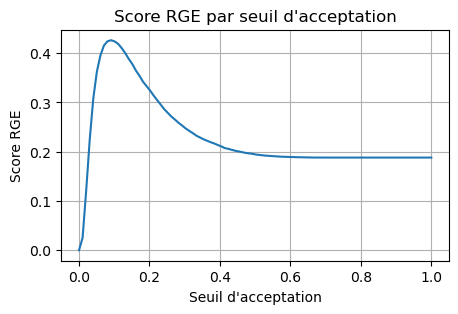

In [45]:
acceptance_values, rge_values = get_rge_by_acceptance(y_train, proba_preds_train, X_train["AMT_CREDIT"])
plot_rge_by_acceptance(acceptance_values, rge_values)

In [46]:
best_index = np.argmax(rge_values)
best_rge_train = rge_values[best_index]
best_acceptance = acceptance_values[best_index]

print("Seuil d'acceptation optimal :", round(best_acceptance, 2))
print("Score RGE (train) pour ce seuil :", round(best_rge_train, 5))

best_binary_preds_test = (proba_preds_test >= best_acceptance).astype(int)
best_rge_test = rge_score(y_test, best_binary_preds_test, X_test["AMT_CREDIT"])
print("Score RGE (test) pour ce seuil :", round(best_rge_test, 5))

Seuil d'acceptation optimal : 0.09
Score RGE (train) pour ce seuil : 0.42638
Score RGE (test) pour ce seuil : 0.43124


## Diversification des modèles

In [47]:
def apply_classifier(classifier, X_train, X_test, y_train, amt_credit_train) :

    classifier.fit(X_train, y_train)    

    preds = {"proba_train" : classifier.predict_proba(X_train)[:, 1],
             "proba_test" : classifier.predict_proba(X_test)[:, 1]}

    acceptance_values, rge_values = get_rge_by_acceptance(y_train, preds["proba_train"], amt_credit_train)
    preds["acceptance_curve"] = (acceptance_values, rge_values)
    preds["acceptance"] = acceptance_values[np.argmax(rge_values)]
    
    preds["binary_train"] = (preds["proba_train"] >= preds["acceptance"]).astype(int)
    preds["binary_test"] = (preds["proba_test"] >= preds["acceptance"]).astype(int)

    return preds

In [48]:
def evaluate_preds(preds, y_train, y_test, amt_credit_train, amt_credit_test) :
    
    return {
        "auroc_train" : roc_auc_score(y_train, preds["proba_train"]),
        "auroc_test" : roc_auc_score(y_test, preds["proba_test"]),
        "rge_train" : rge_score(y_train, preds["binary_train"], amt_credit_train),
        "rge_test" : rge_score(y_test, preds["binary_test"], amt_credit_test)
    }

In [49]:
dummy_classifiers = {
    "uniform" : DummyClassifier(strategy = "uniform"),
    "stratified" : DummyClassifier(strategy = "stratified"),
    "all_zero" : DummyClassifier(strategy = "most_frequent"),
}

for (name, classifier) in dummy_classifiers.items() :
    preds = apply_classifier(classifier, X_train, X_test, y_train, X_train["AMT_CREDIT"])
    metrics = evaluate_preds(preds, y_train, y_test, X_train["AMT_CREDIT"], X_test["AMT_CREDIT"])
    print("Score RGE sur le jeu de test du", name, "dummy classifier :", round(metrics["rge_test"], 5))

Score RGE sur le jeu de test du uniform dummy classifier : 0.18347
Score RGE sur le jeu de test du stratified dummy classifier : 0.17021
Score RGE sur le jeu de test du all_zero dummy classifier : 0.18347


In [50]:
def display_results(metrics, title = None, acceptance = None, auroc = True, mege = True) :
    
    if title is not None :
        print(title)
    
    if auroc :
        print("AUROC (train) :", round(metrics["auroc_train"], 5))
        print("AUROC (test) :", round(metrics["auroc_test"], 5))
    
    if acceptance is not None :
        print("acceptance :", round(acceptance, 2))
    
    if mege :
        print("RGE (train) :", round(metrics["rge_train"], 5))
        print("RGE (test) :", round(metrics["rge_test"], 5))

--- LogisticRegression ---
AUROC (train) : 0.74697
AUROC (test) : 0.74664
acceptance : 0.09
RGE (train) : 0.42638
RGE (test) : 0.43124


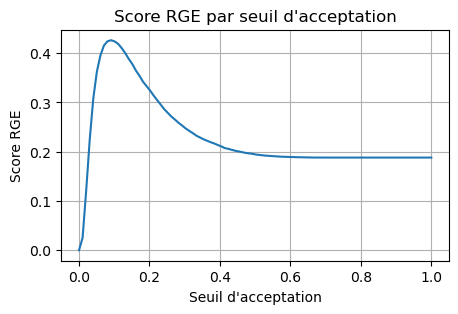

In [51]:
preds = apply_classifier(LogisticRegression(), X_train_processed, X_test_processed, y_train, X_train["AMT_CREDIT"])
metrics = evaluate_preds(preds, y_train, y_test, X_train["AMT_CREDIT"], X_test["AMT_CREDIT"])
display_results(metrics, title = "--- LogisticRegression ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

In [52]:
random_forest_params = {
    "n_estimators" : 100,
    "max_depth" : 10,
    "min_samples_split" : 2,
    "min_samples_leaf" : 1,
    "max_features" : 5,
    "bootstrap" : True,
    "random_state" : 42
}

random_forest = RandomForestClassifier(**random_forest_params)

--- RandomForest ---
AUROC (train) : 0.78619
AUROC (test) : 0.7105
acceptance : 0.09
RGE (train) : 0.49471
RGE (test) : 0.38967


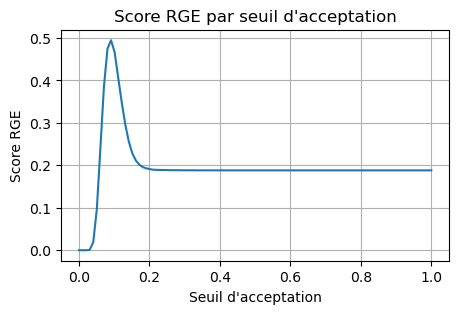

In [53]:
preds = apply_classifier(random_forest, X_train_processed, X_test_processed, y_train, X_train["AMT_CREDIT"])
metrics = evaluate_preds(preds, y_train, y_test, X_train["AMT_CREDIT"], X_test["AMT_CREDIT"])
display_results(metrics, title = "--- RandomForest ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

In [54]:
light_gbm_params = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "num_leaves" : 30,
    "learning_rate" : 0.05,
    "feature_fraction" : 0.9,
    "bagging_fraction" : 0.8, 
    "bagging_freq" : 5,
    "n_estimators" : 100,
    "verbose" : -1,
    "random_state" : 42
}

light_gbm = LGBMClassifier(**light_gbm_params)

--- LightGBM ---
AUROC (train) : 0.77408
AUROC (test) : 0.75547
acceptance : 0.09
RGE (train) : 0.46434
RGE (test) : 0.44667


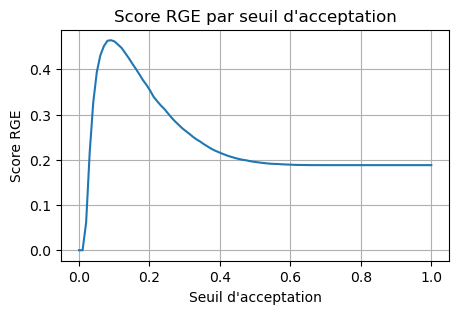

In [55]:
preds = apply_classifier(light_gbm, X_train_processed, X_test_processed, y_train, X_train["AMT_CREDIT"])
metrics = evaluate_preds(preds, y_train, y_test, X_train["AMT_CREDIT"], X_test["AMT_CREDIT"])
display_results(metrics, title = "--- LightGBM ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

## Importance des features

In [56]:
def plot_feature_importances(df, nb_features, title, figsize = (6, 4)) :
    
    df = df.sort_values("importance", ascending = False).reset_index()
    df["importance_normalized"] = df["importance"] / df["importance"].sum()

    plt.figure(figsize = figsize)
    ax = plt.subplot()
    
    ax.barh(list(reversed(list(df.index[:nb_features]))), 
            df["importance_normalized"].head(nb_features), 
            align = "center",
            edgecolor = "k")
    
    ax.set_yticks(list(reversed(list(df.index[:nb_features]))))
    ax.set_yticklabels(df["feature"].head(nb_features))
    ax.tick_params(axis = "y", labelsize = 8)
    
    plt.xlabel("Importance normalisée")
    plt.title(title, size = 14)
    plt.show()
    
    return df.drop(columns = ["index"])

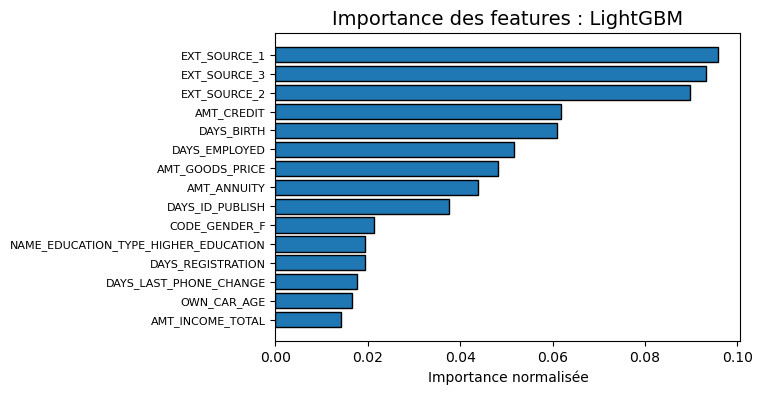

In [57]:
light_gbm_feature_importances = pd.DataFrame({
        "feature" : list(X_train.columns),
        "importance" : light_gbm.feature_importances_
    })

title = "Importance des features : LightGBM"
light_gbm_feature_importances_sorted = plot_feature_importances(light_gbm_feature_importances, 15, title)

In [58]:
explainer = shap.Explainer(light_gbm)
shap_values = explainer(X_test_processed)
print(shap_values.shape)

(61503, 242, 2)


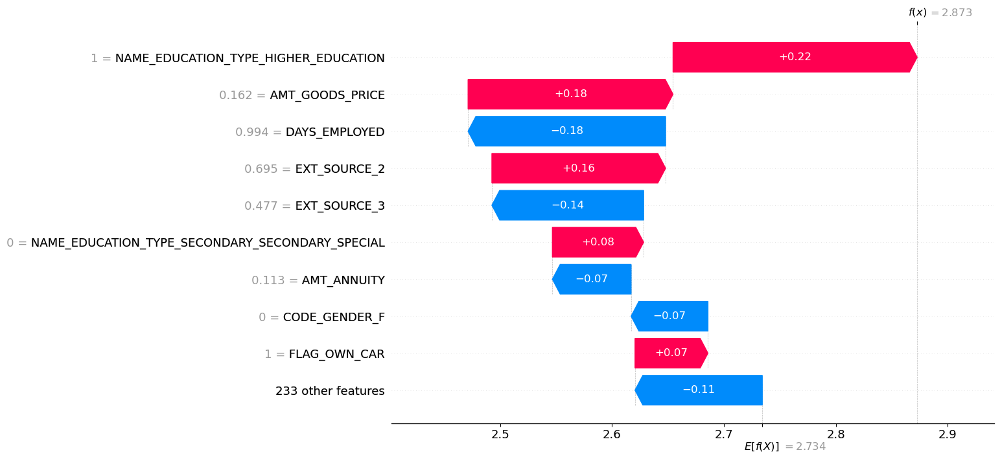

In [59]:
row_index = 0
waterfall = shap.plots.waterfall(shap_values[row_index, :, 0], max_display = 10, show = False)
waterfall.set_size_inches(12, 8)
plt.show()

## Gestion du déséquilibre

In [60]:
def balance_sample(X_train, y_train, strategy) :

    if strategy == "over" :
        oversampler = RandomOverSampler(random_state = 42)
        return oversampler.fit_resample(X_train, y_train)
    
    if strategy == "under" :
        undersampler = RandomUnderSampler(random_state = 42)
        return undersampler.fit_resample(X_train, y_train)
    
    elif strategy == "smote" :
        smote = SMOTE(random_state = 42)
        return smote.fit_resample(X_train, y_train)

In [79]:
def preprocess_with_balancing(X_train, X_test, y_train, strategy) :
    
    # Imputation des valeurs manquantes
    imputer = CustomMedianImputer()
    data = {"X_train" : imputer.fit_transform(X_train)}
    data["X_test"] = imputer.transform(X_test)
            
    # Application de la méthode de sampling pour équilibrer le jeu d'entraînement
    data["X_train"], data["y_train"] = balance_sample(data["X_train"], y_train, strategy)
            
    # Abandon des colonnes n'ayant qu'une seule valeur
    columns_to_drop = data["X_train"].columns[data["X_train"].nunique() == 1]
    data["X_train"] = data["X_train"].drop(columns = columns_to_drop)
    data["X_test"] = data["X_test"].drop(columns = columns_to_drop)
    
    # Copie de AMT_CREDIT avant la normalisation
    data["amt_credit_train"] = X_train["AMT_CREDIT"].copy()
    data["amt_credit_test"] = X_test["AMT_CREDIT"].copy()
    
    # Normalisation des valeurs
    scaler = CustomMinMaxScaler()
    data["X_train"] = scaler.fit_transform(data["X_train"])
    data["X_test"] = scaler.transform(data["X_test"])
    
    return data

In [80]:
data_over = preprocess_with_balancing(X_train, X_test, y_train, "over")
print("X_train :", data_over["X_train"].shape)
print("y_train :", data_over["y_train"].shape)

data_under = preprocess_with_balancing(X_train, X_test, y_train, "under")
print("X_train :", data_under["X_train"].shape)
print("y_train :", data_under["y_train"].shape)

data_smote = preprocess_with_balancing(X_train, X_test, y_train, "smote")
print("X_train :", data_smote["X_train"].shape)
print("y_train :", data_smote["y_train"].shape)

X_train : (452296, 242)
y_train : (452296,)
X_train : (39720, 236)
y_train : (39720,)
X_train : (452296, 242)
y_train : (452296,)



--- LightGBM (oversampling) ---
AUROC (train) : 0.77547
AUROC (test) : 0.75686
acceptance : 0.53
RGE (train) : 0.46236
RGE (test) : 0.44564


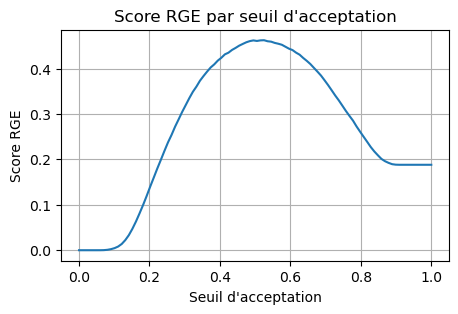

In [81]:
preds = apply_classifier(classifier = light_gbm,
                         X_train = data_over["X_train"],
                         X_test = data_over["X_test"],
                         y_train = data_over["y_train"],
                         amt_credit_train = data_over["amt_credit_train"]
)

metrics = evaluate_preds(preds, data_over["y_train"], y_test, data_over["amt_credit_train"], data_over["amt_credit_test"])
display_results(metrics, title = "\n--- LightGBM (oversampling) ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

--- LightGBM (undersampling) ---
AUROC (train) : 0.78673
AUROC (test) : 0.75379
acceptance : 0.17
RGE (train) : 0.02972
RGE (test) : 0.07016


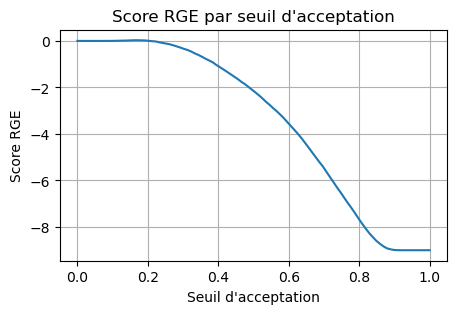

In [82]:
preds = apply_classifier(classifier = light_gbm,
                         X_train = data_under["X_train"],
                         X_test = data_under["X_test"],
                         y_train = data_under["y_train"],
                         amt_credit_train = data_under["amt_credit_train"]
)

metrics = evaluate_preds(preds, data_under["y_train"], y_test, data_under["amt_credit_train"], data_under["amt_credit_test"])
display_results(metrics, title = "--- LightGBM (undersampling) ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])


--- LightGBM (smote sampling) ---
AUROC (train) : 0.97689
AUROC (test) : 0.7327
acceptance : 0.12
RGE (train) : 0.41596
RGE (test) : 0.41592


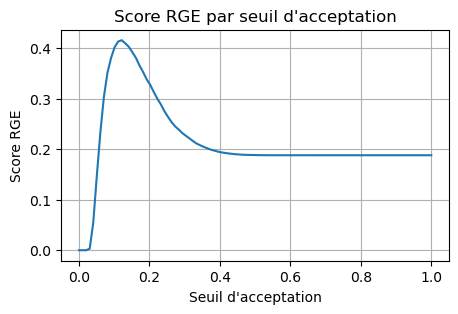

In [83]:
preds = apply_classifier(classifier = light_gbm,
                         X_train = data_smote["X_train"],
                         X_test = data_smote["X_test"],
                         y_train = data_smote["y_train"],
                         amt_credit_train = data_smote["amt_credit_train"]
)

metrics = evaluate_preds(preds, data_smote["y_train"], y_test, data_smote["amt_credit_train"], data_smote["amt_credit_test"])
display_results(metrics, title = "\n--- LightGBM (smote sampling) ---", acceptance = preds["acceptance"])
plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

## Validation croisée

In [84]:
def preprocess_folds(X_input, y_input, strategy = None, n_folds = 5, stratify = True, verbose = 1) :
    
    X = X_input.reset_index(drop = True)
    y = y_input.reset_index(drop = True)
    
    if stratify :
        folds = StratifiedKFold(n_splits = n_folds, shuffle = True, random_state = 42)
    else :
        folds = KFold(n_splits = n_folds, shuffle = True, random_state = 42)
    
    folds_data = []
    
    for fold, (train_index, valid_index) in enumerate(folds.split(X, y)) :
        
        if verbose > 0 :
            print(f"Prétraitement du fold {fold + 1}/{n_folds}.")
            
        X_train, X_valid = X.loc[train_index], X.loc[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        
        data = global_preprocessor(X_train, X_valid, y_train, y_valid, strategy)
        folds_data.append(data)
    
    if verbose > 0 :
        print("Prétraitement terminé.")
    
    return folds_data

In [85]:
def global_preprocessor(X_train, X_valid, y_train, y_valid, strategy = None) :
    
    if strategy in ["over", "under", "smote"] :
        data = preprocess_with_balancing(X_train, X_valid, y_train, strategy)
        data["X_valid"] = data.pop("X_test")
        data["amt_credit_valid"] = data.pop("amt_credit_test")
    
    else :
        data = {"y_train" : y_train.copy(),
                "amt_credit_train" : X_train["AMT_CREDIT"].copy(),
                "amt_credit_valid" : X_valid["AMT_CREDIT"].copy()}
        data["X_train"], data["X_valid"] = preprocess(X_train, X_valid)
        
    data["y_valid"] = y_valid.copy()
    
    return data

In [86]:
print("--- Prétraitement standard ---")
folds_data_standard = preprocess_folds(X_train, y_train)

--- Prétraitement standard ---
Prétraitement du fold 1/5.
Prétraitement du fold 2/5.
Prétraitement du fold 3/5.
Prétraitement du fold 4/5.
Prétraitement du fold 5/5.
Prétraitement terminé.


In [87]:
print("--- Prétraitement oversampling ---")
folds_data_over = preprocess_folds(X_train, y_train, strategy = "over")

--- Prétraitement oversampling ---
Prétraitement du fold 1/5.
Prétraitement du fold 2/5.
Prétraitement du fold 3/5.
Prétraitement du fold 4/5.
Prétraitement du fold 5/5.
Prétraitement terminé.


In [88]:
print("--- Prétraitement undersampling ---")
folds_data_under = preprocess_folds(X_train, y_train, strategy = "under")

--- Prétraitement undersampling ---
Prétraitement du fold 1/5.
Prétraitement du fold 2/5.
Prétraitement du fold 3/5.
Prétraitement du fold 4/5.
Prétraitement du fold 5/5.
Prétraitement terminé.


In [89]:
print("--- Prétraitement SMOTE ---")
folds_data_smote = preprocess_folds(X_train, y_train, strategy = "smote")

--- Prétraitement SMOTE ---
Prétraitement du fold 1/5.
Prétraitement du fold 2/5.
Prétraitement du fold 3/5.
Prétraitement du fold 4/5.
Prétraitement du fold 5/5.
Prétraitement terminé.


In [90]:
def cross_validation(folds_data, classifier, verbose = 2) :
    
    scores = []
    
    for fold, data in enumerate(folds_data) :
        
        preds = apply_classifier(classifier, data["X_train"], data["X_valid"], data["y_train"], data["amt_credit_train"])
        metrics = evaluate_preds(preds, data["y_train"], data["y_valid"], data["amt_credit_train"], data["amt_credit_valid"])
        scores.append(metrics["rge_test"])

        if verbose == 2 :
            print("Score RGE sur le fold ", fold + 1, "/", len(folds_data), " : ", round(metrics["rge_test"], 5))
        elif verbose > 2 :
            title = "\n--- Fold " + str(fold + 1) + "/" + str(len(folds_data)) + " ---"
            display_results(metrics, title = title, acceptance = preds["acceptance"])
            
        if verbose > 3 :
            plot_rge_by_acceptance(preds["acceptance_curve"][0], preds["acceptance_curve"][1])

    scores.insert(0, np.mean(scores))
    
    if verbose > 0 :
        print("Score RGE moyen : ", round(scores[0], 5))

    return scores

In [91]:
cv_scores_standard = cross_validation(folds_data_standard, light_gbm)

Score RGE sur le fold  1 / 5  :  0.43249
Score RGE sur le fold  2 / 5  :  0.45014
Score RGE sur le fold  3 / 5  :  0.43541
Score RGE sur le fold  4 / 5  :  0.42993
Score RGE sur le fold  5 / 5  :  0.41059
Score RGE moyen :  0.43171


## Recherche d'hyperparamètres

In [95]:
def generate_param_combinations(param_grid) :
    
    keys = param_grid.keys()
    values = param_grid.values()
    
    return [dict(zip(keys, value)) for value in product(*values)]

In [96]:
def grid_search(folds_data, classifier_builder, param_grid, verbose = 0) :

    param_combinations = generate_param_combinations(param_grid)

    best_score = float("-inf")
    best_params = None

    for step, params in enumerate(param_combinations) :
        
        print("Etape ", step + 1, "/", len(param_combinations), " :   ", sep = "", end = "")
        
        if verbose > 0 :
            print("\n", params, sep = "")
        
        classifier = classifier_builder(params)
        scores = cross_validation(folds_data, classifier, verbose = 1)
        
        if scores[0] > best_score :
            best_params = params
            best_score = scores[0]
    
    print("\nGrille de recherche terminée :   best_score =", best_score)
    print(best_params)
            
    return best_params, best_score

In [ ]:
param_grid = {
    "num_leaves" : [15, 20, 25],
    "learning_rate" : [0.05, 0.1, 0.2],
    "feature_fraction" : [0.8, 0.9],
    "bagging_fraction" : [0.7, 0.8],
    "bagging_freq" : [4, 5],
}

def light_gbm_builder(params) :
    
    base_params = {
        "boosting_type": "gbdt",
        "objective": "binary",
        "n_estimators" : 100,
        "verbose" : -1,
        "random_state" : 42
    }
    
    return LGBMClassifier(**base_params, **params)

best_params, best_score = grid_search(folds_data_standard, light_gbm_builder, param_grid)

# Détection du datadrift

In [52]:
reference = clean_df.sample(n = 5000, replace = False)
current = clean_df.sample(n = 5000, replace = False)

report = Report(metrics = [DataDriftPreset()])
report.run(reference_data = reference, current_data = current)

display(report)